# Final Project Notebook - Spring 2024

In [1]:
import matplotlib.pyplot as plt #to create plots
import imageio #for working with images
import torch #PyTorch library
import torchvision #torchvision library for computer vision tasks
from torchvision import models, transforms #importing models and transforms from torchvision
import numpy as np #for numerical operations
from torchvision.models import * #Importing all models from torchvision
from PIL import Image #for image processing
import requests #to make HTTP requests
from torchvision import models #importing models from torchvision
from torchsummary import summary #for summarizing PyTorch models

In [2]:
def plot(x):
    fig, ax = plt.subplots() #create a new figure and axis
    im = ax.imshow(x,cmap='gray') #display the image using imshow
    ax.axis('off') #turn off labels on axis
    fig.set_size_inches(20, 20) #figure size
    plt.show() #show the plot

####the function above creates a new figure and axis using the matplotlib's 'subplots()' function, then it displays the input grayscale image using 'imshow()' with a grayscale color map. The axis labels are turned off to display the image more clearly. The size of the figure is 20x20 inches.
#####parameters: x(array-like): input image data to be plotted.

In [3]:
#load image from URL
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')

<ipython-input-3-2ec693cda6c2>:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


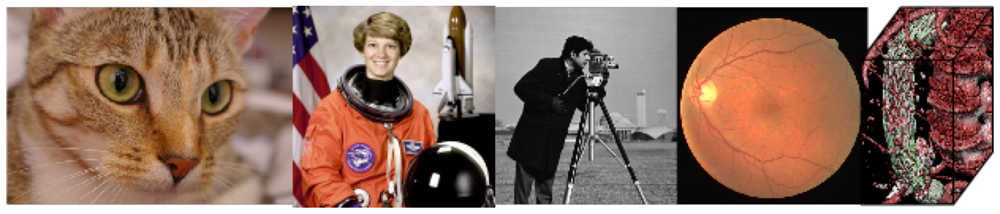

In [4]:
plot(im) #display the image

In [5]:
#load the pre trained AlexNet model and move it to GPU
net = alexnet(pretrained=True).cuda(0) #cuda device 0

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 147MB/s]


In [6]:
#define normalization parameters to normalize the input imgaes
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406], #mean values for RGB channels
   std=[0.229, 0.224, 0.225] #standard deviation values for RGB channels
)
#define a sequence of image transformations to apply to the input images
preprocess = transforms.Compose([
   transforms.Resize(256), #resizing image to 256x256 pixels
   transforms.CenterCrop(224), #cropping the center 224x224 pixels from the image
   transforms.ToTensor(), #converting the image to a PyTorch tensor
   normalize # normalizing the image using the specified mean and std
])

In [7]:
#load image from URL
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')

<ipython-input-7-3fdb040fd254>:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


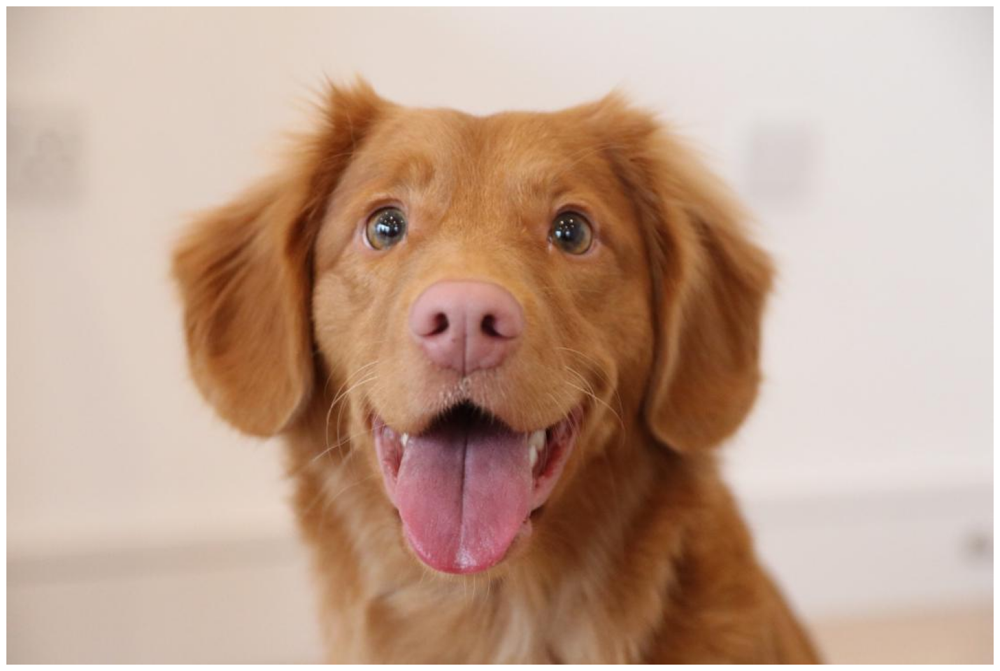

In [8]:
plot(im) #display image

In [9]:
image = Image.fromarray(im) #convert the numpy array 'im' to PIL Image object

In [10]:
img_tensor = preprocess(image) #to apply preprocessing transoframtions to the image

In [11]:
img_tensor = img_tensor.unsqueeze_(0) #adding extra dimension to the tensor to represent the batch size

In [12]:
img_tensor.shape #shape of tensor

torch.Size([1, 3, 224, 224])

In [13]:
img_variable = torch.tensor(img_tensor).cuda(0) #convert the tensor to a CUDA tensor and move it to GPU

<ipython-input-13-cfcfe911189c>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0) #convert the tensor to a CUDA tensor and move it to GPU


In [14]:
out = net(img_variable) #pass the input image thru the pretained AlexNet model

In [15]:
label_index = out.cpu().data.numpy().argmax() #getting the index of the class with the highest probability from the output

In [16]:
label_index #print the label that corresponds to the predicted class

220

In [17]:
#indices of the top 10 predicted classes
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])

In [18]:
#defining the URL to fetch labels
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'

In [19]:
#fetch the lables from the URL and convert them to a dictionary
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}

In [20]:
print(labels[label_index])

Sussex spaniel


In [21]:
for i in range(10):
    print(labels[top_list[i]]) #print the top 10 predicted labels

Sussex spaniel
golden retriever
chow, chow chow
Brittany spaniel
Tibetan mastiff
Irish setter, red setter
clumber, clumber spaniel
tennis ball
Newfoundland, Newfoundland dog
Blenheim spaniel


In [22]:
net

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [23]:
summary(net, (3, 224, 224)) #print a summary of the AlexNet model architecture

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [24]:
out = net.features[0](img_variable).cpu().detach().numpy() #pass the input image thru the first layer of the AlexNet model

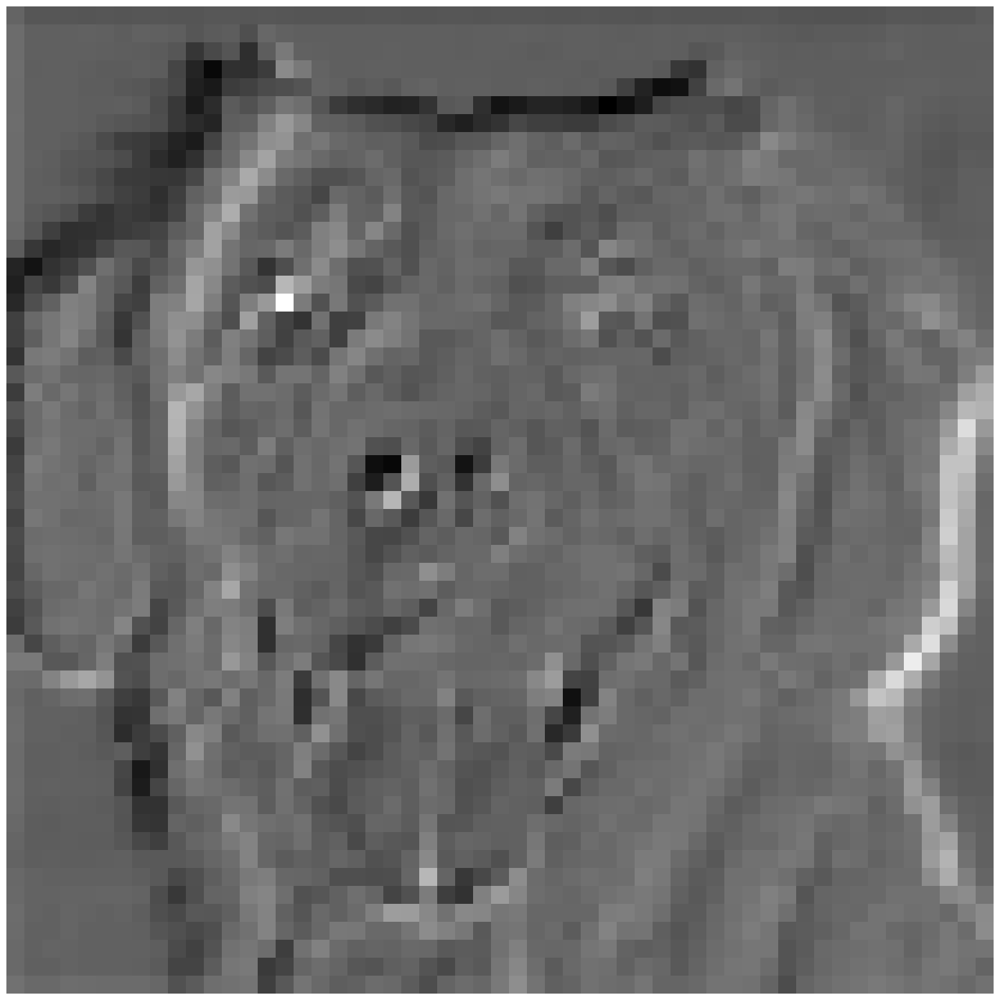

In [25]:
plot(out[0,0,:,:]) #visualize the output

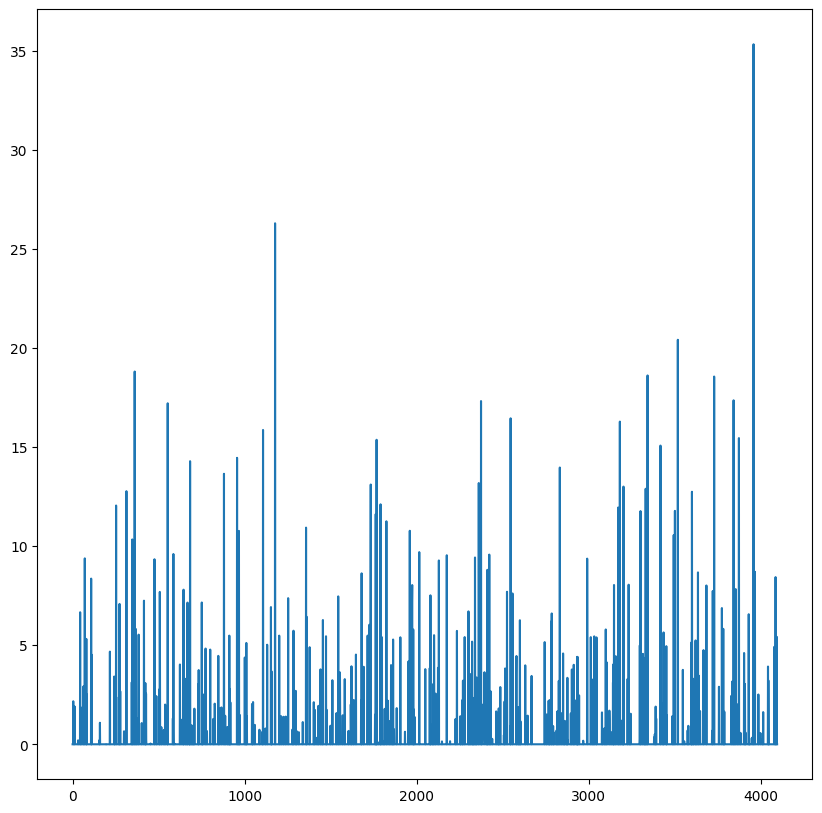

In [26]:
#plot the output of the first 6 layers of the classifier part of the AlexNet model
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
#get the current figure
fig = plt.gcf()
#set figure size
fig.set_size_inches(10, 10)

In [27]:
#read image from URL
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')

<ipython-input-27-b4c871bf7412>:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


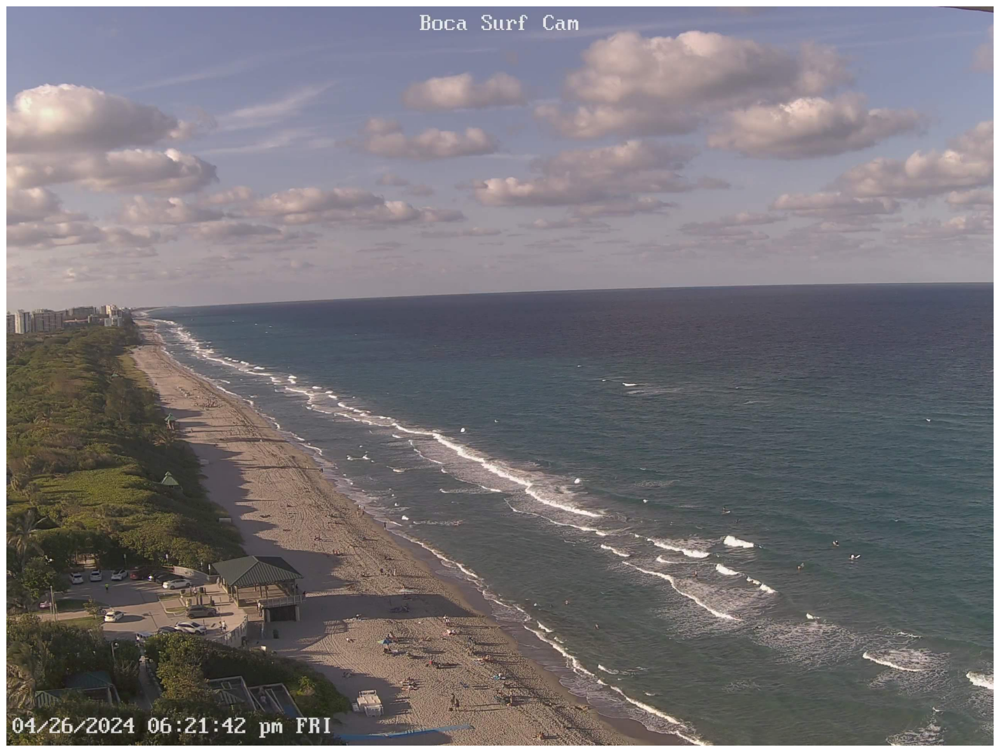

In [28]:
#plot the image
plot(im)

In [29]:
def load_im(im): #define a function to load and preprocess image
    image = Image.fromarray(im) #convert the image to PIL format
    img_tensor = preprocess(image) #apply preprocessing transformations
    img_tensor = img_tensor.unsqueeze_(0) #add batch dim
    img_variable = torch.tensor(img_tensor).cuda(0) #convert to CUDA tensor and move to GPU
    return img_variable

####The function above takes an input image (represented as an array) and converts it to the PIL formt using 'Image.fromarray()'. Then it applies preprocessing transformations to the image using the 'preprocess()' function, and after the preprocessing it adds a batch dimension to the image tensor using 'img_tensor.unsqueeze_(0). Then it converts the preprocessed image tensor to a CUDA tensor and moves it to the GPU.
##### parameters: im(array-like): input image data to be loaded and preprocessed.
#####Returns: img_variable(torch.Tensor): preprocessed image tensor.

In [30]:
out = net(load_im(im)) #pass the image thru the network and print the predictions

<ipython-input-29-059ee6b81a93>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0) #convert to CUDA tensor and move to GPU


In [31]:
def inference(im): #define function to perform inference on an image
    out = net(load_im(im)) #pass image thru the network
    label_index = out.cpu().data.numpy().argmax() #index of the predicted class
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) #indices of the top 10 predicted classes
    print(labels[label_index]) #print label of the predicted class
    print('____') #print seperator
    for i in range(10):
        print(labels[top_list[i]]) #print the top 10 predicted labels

#### The function above takes an input image and passes it thru a neural network model 'net' using the 'load_im()' function. The output of the model is stored in the variable 'out'. The index of the predicted class is computed using the folowing: "label_index = out.cpu().data.numpy().argmax()". the indicies of the top 10 predicted classes are compute using the folowing: "top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])" which sorts the probabilites in decending order and selects the top 10 indices and finaly flips the order.
#####Parameters: im(array-like): input image data to be processed

In [32]:
inference(im) #perform inference on the image

promontory, headland, head, foreland
____
promontory, headland, head, foreland
seashore, coast, seacoast, sea-coast
sandbar, sand bar
volcano
valley, vale
breakwater, groin, groyne, mole, bulwark, seawall, jetty
lakeside, lakeshore
dam, dike, dyke
cliff, drop, drop-off
wing


<ipython-input-29-059ee6b81a93>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0) #convert to CUDA tensor and move to GPU


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [ ]:
%%capture
!pip install wandb #install the wandb library using pip
!apt-get install poppler-utils #install poppler-utils package for working with PDF files
!pip install pdf2image #install pdf2image library for converting PDF to image
!pip install flashtorch #install the flashtorch library for visualizing neural networks
import requests #for making HTTP requests
from pdf2image import convert_from_path #for converting PDF to image
import matplotlib.pyplot as plt #to create plots
import numpy as np #for numerical operations
import torch #PyTorch library
import requests #for making HTTP requests
from torchvision import * #import all modules from torchvision
from torchvision.models import * #import all models from torchvision
from flashtorch.utils import apply_transforms #to apply transformations
import wandb as wb #improting wandb lib for experiment tracking

In [ ]:
def GPU(data): #defining a function that creates a tensor on GPU with requires_grad=True
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data): #defining a function that creates a tensor on GPU with rquires_grad=False
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

In [ ]:
def plot(x): #define a function to plot a 'grayscale' image
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray') #display the image with grayscale colormap
    ax.axis('off') #turn off axis labels
    fig.set_size_inches(5, 5) #set figure size
    plt.show() #display the plot

####The function above creates a plot of a grayscale image, it is using a 2d array that represnts pixels values of the grayscale image and displayes the image using a grayscale colormap. The figure size is set to 5x5 inches.
#####parameters: the input image data to be plotted.

In [ ]:
def get_google_slide(url): #define a function to get the downloaded URL for a Google Slides presentation as a PDF
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5] #extract the unique identifier of the presentation from the URL
    page_id = url.split('.')[-1] #extract the page ID from the URL
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id #construct the download URL for the PDF version of the presentation

def get_slides(url): #define a function to download and convert the Google Slides presentation to images
    url = get_google_slide(url) #get the downloaded for the PDF version of the presentation
    r = requests.get(url, allow_redirects=True) #download the PDF file
    open('file.pdf', 'wb').write(r.content) #save the file locally
    images = convert_from_path('file.pdf', 500) #convert the PDF file to a list of images
    return images

def load(image): #define a function to load an image and apply transformations for processing
    #apply the transformations to the imags and move it to the specified device
    return apply_transforms(image).clone().detach().requires_grad_(True).to(device) #device is either CPU or GPU

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") #determine the device for processing

####The function above 'get_google_slide(url)' takes the url of a google slides presentation and extracts the unique identifierof the presentation and the page ID from the url. After that it constructs the download url for the PDF version of the presentation using the extracted components.
#####Parameters: url(str): the url of the google slides presentation
#####Returns: str: the url for downloading the PDF version of the presentation.

####The function above 'get_slides(url)' gets the download url for the PDF version of the presentation using 'get_google_slides()' function. It then downloads the PDF file and saves it locally as "file.pdf" and then it converts the PDF filev to a list of images using the 'comvert_from_path()' function.
#####Parameters: url(str): the url of the google slides
#####Returns: list of images extracted from the presentation.

####The function above 'load(image)' applies transformations to the input image; like cloning, detaching, requiring gradients and moving to the specified device (CPU or GPU).
#####Parameters: input image data
#####Returns: processed image tensor

In [ ]:
#define a dictionary to store the mapping of class indices to labels
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

In [ ]:
#load the AlexNet model with the pretrained weights and move it to the specified device
model = alexnet(weights='DEFAULT').to(device) #device (CPU or GPU)
model.eval(); #set model to evaluation mode

In [ ]:
#URL of the google slides presentation with images waiting to be processed
url = "https://docs.google.com/presentation/d/13a4KM3dNl8eSJ9v2lPkgfAc5LMut7LwC-bj2rlt4-Jg/edit?pli=1#slide=id.g2b78f4662ad_0_245"

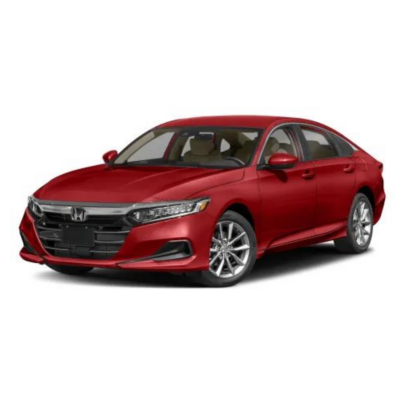

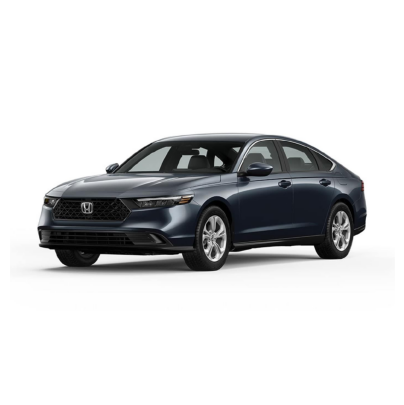

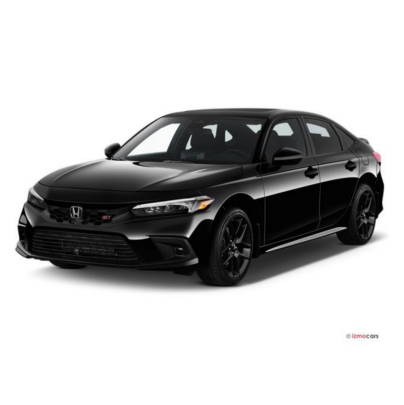

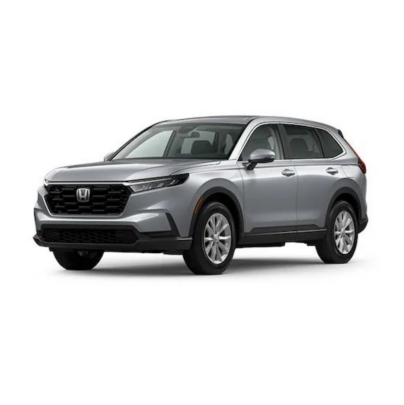

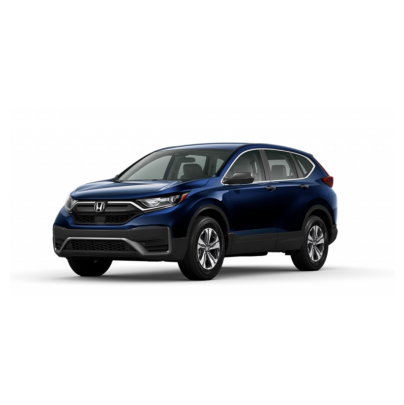

...

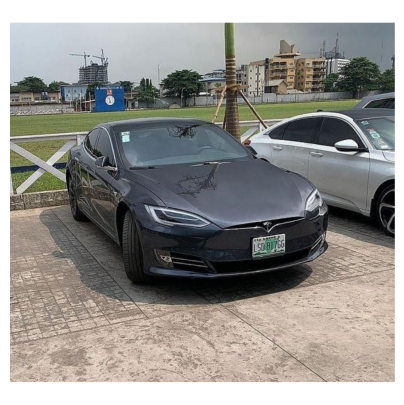

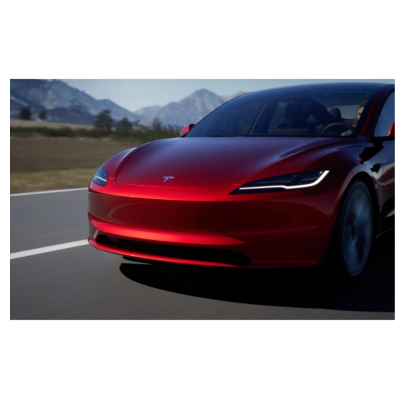

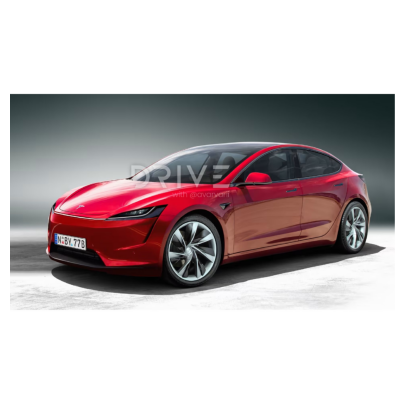

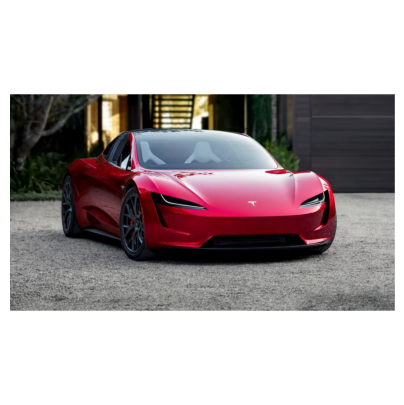

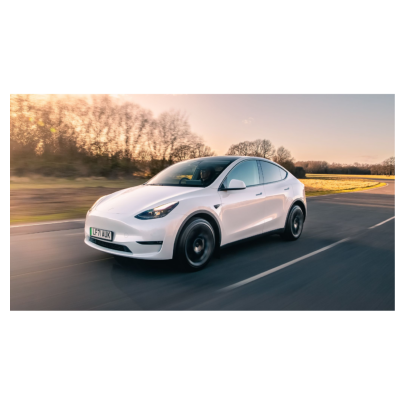

In [ ]:
images = [] #list that stores the processed images

#iterating over each image that is extracted from the presentation
for image in get_slides(url):

    plot(image) #display image

    images.append(load(image)) #load image, apply trasnformations and move it to the specified device

images = torch.vstack(images) #stack the processed images into a single tensor

In [ ]:
images.shape #print the shape of the tensor that contains the images

torch.Size([50, 3, 224, 224])

In [ ]:
model(images) #pass the images thru the model to get predictions

tensor([[-3.6483, -5.5477, -4.2670,  ..., -4.7808, -0.6461,  1.6442],
        [-1.6493, -5.3805, -1.9822,  ..., -6.6333,  0.7337,  0.8952],
        [-1.5156, -6.6792, -1.5257,  ..., -5.0972,  1.3433,  0.1259],
        ...,
        [-5.2395, -5.2293, -4.1441,  ..., -7.8637, -0.8797,  2.0236],
        [-4.0675, -5.3809, -2.4086,  ..., -3.1754, -0.3507,  4.5984],
        [-2.4791, -6.9878, -1.9808,  ..., -6.6733, -0.8083,  2.5416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images) #name the model 'y'

In [ ]:
y.shape #pring the shape of the output tensor from the model

torch.Size([50, 1000])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy() #get the predicted class labels for each image

In [ ]:
#print the corresponding labels fro the predicted classes
for i in list(guesses):
    print(labels[i])

beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
sports car, sport car
sports car, sport car
minivan
sports car, sport car
racer, race car, racing car
racer, race car, racing car
car wheel
convertible
sports car, sport car
convertible
sports car, sport car
sports car, sport car
golfcart, golf cart
sports car, sport car
sports car, sport car
sports car, sport car
sports car, sport car
convertible
sports car, sport car
sports car, sport car
sports car, sport car
convertible
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
minivan
beach wagon, station wagon, wagon, estate car, beach waggon,

In [ ]:
#binary array representing the ground truth
Y = np.zeros(50,) #50 samples
Y[25:] = 1 #first 25 belong to class 0 and the rest to class 1

In [ ]:
Y #print the array

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy() #convert the output tensor from the model to a numpy array

In [ ]:
X.shape #print the shape of the output numpy array

(50, 1000)

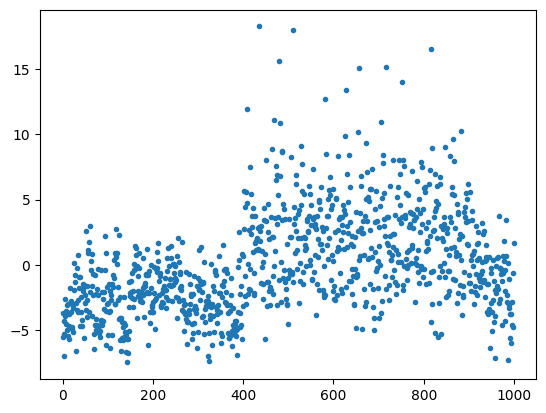

In [ ]:
plt.plot(X[0],'.') #plot the values of the first row of the output tensor

In [ ]:
X[0] #print the values of the first row of the output tensor

array([-3.648302  , -5.5477095 , -4.267003  , -6.9696536 , -5.268299  ,
       -3.8952541 , -2.5804634 , -4.5244064 , -3.5475607 , -3.1067102 ,
       -4.954578  , -5.420493  , -2.9685116 , -3.7742467 , -4.682495  ,
       -5.6384597 , -1.7352468 , -2.9375455 , -3.5905588 , -2.7332172 ,
       -4.7801814 , -4.9433727 , -5.1535516 , -3.045145  , -3.2972083 ,
       -1.9279649 ,  0.13217556, -0.75489336, -1.3281226 , -6.5563917 ,
       -2.9308858 , -3.4373817 , -0.20724016, -3.5743175 ,  0.78836   ,
       -2.696989  , -1.8031819 , -0.9369866 , -0.95287704, -4.6648464 ,
       -3.5949035 , -2.4335008 , -4.186327  , -4.658437  , -1.7991076 ,
       -1.4311275 , -2.0264175 , -1.5240124 , -5.6288276 , -2.887846  ,
       -2.3174996 , -3.4647496 ,  2.5541537 , -1.6043646 , -2.7000084 ,
       -3.9968052 ,  0.9071237 ,  1.159525  , -3.590595  ,  1.7322692 ,
        2.9539351 , -2.1082158 ,  0.3018512 , -0.42977154, -3.910584  ,
       -1.5801091 ,  0.84917176, -2.343983  , -0.724004  , -6.43

In [ ]:
np.argmax(X[0]) #get the index of the class with the highest prob for the first image

436

In [ ]:
labels[948] #get the label corresponding to the class with index 948

'Granny Smith'

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10] #get the indices of the top ten classes with the highest probfor the first image

In [ ]:
for i in top_ten: #print the labels corresponding to the top ten classes
    print(labels[i])

beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
convertible
sports car, sport car
car wheel
pickup, pickup truck
minivan
racer, race car, racing car
limousine, limo
grille, radiator grille
amphibian, amphibious vehicle


In [ ]:
labels #print the dictionary containing the mapping of the class indices to the labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 73., 220., 296., 188., 134.,  54.,  22.,   5.,   5.,   3.]),
 array([-7.4718256 , -4.90003586, -2.32824588,  0.24354391,  2.81533384,
         5.38712358,  7.95891333, 10.53070354, 13.10249329, 15.67428303,
        18.24607277]),
 <BarContainer object of 10 artists>)

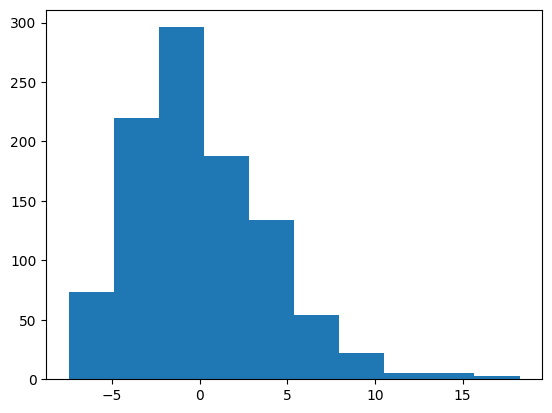

In [ ]:
plt.hist(X[0]) #plot histogram of the values in the first row of the output tensor

In [ ]:
#move the input and output data to GPU
X = GPU_data(X)
Y = GPU_data(Y)

In [ ]:
def softmax(x): #define the softmax function to compute probabilites from logits
    s1 = torch.exp(x - torch.max(x,1)[0][:,None]) #subtract the max value along each row to prevent overflow
    s = s1 / s1.sum(1)[:,None] #normalize the exponentiated values to get probabilities
    return s

####The function above computes the softmax function for each row of the input tensor x. first it subtracts the maximum value along each row to prevent overflow, and after, it exponentiates the values and normalizes them to get probabilites.
#####Parameters: x(Tensor)-input logits.
#####Returns: Tensor: probabilites computed from the input logits.

In [ ]:
def cross_entropy(outputs, labels): #define the cross entropy loss function
    #compute the negative log likelihood of the predicted probablities
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

####The function above computes the cross-entropy loss between the predicted probabilities and the 'true' labels, by first computing the softmax probabilities and then calculating the negative log likelihood of the predicted probabilities for the true labels. Note that the result is averaged over the batch size in order to get the final cross-entropy loss.
#####Parameters: -outputs(Tensor): predicted probabilties from the model. -labels(Tensor): true labels of the data.
#####Returns: cross-entropy loss.

In [ ]:
#define a function to generate samples from truncated normal distribution
def Truncated_Normal(size):
   #generate uniform random samples in the range (exp(-2), 1]
    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
   #Generate uniform random samples in the range [0, 1)
    u2 = torch.rand(size)
   #apply inverse transform sampling method to generate samplesfrom the standrad normal distribution
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

####The function above generates samples from a truncated normal dist. using the inverse transform sampling method, by first generating the uniform random samples using torch.rand() in the specified range, and then it applies the inverse transform sampling method to generate samples from the standard normal dist. Note that the result is truncated to ensure that it falls within the range we desire.
#####Parameters: -size(tuple): the desired shape of the output tensor.
#####Returns: -tensor: samples from the truncated normal dist.

In [ ]:
def acc(out,y): #define function to calculate accuracy
    with torch.no_grad(): #calculate the accuracy of the predictions
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

####The function above calculates the accuracy of the predictions, by comparing the indicies of the max values along dim 1 of the predicted output with the true labels. The result will be the ratio of the correct predictions to the total number of samples.
#####Parameters: -out(Tensor): predicted output from the model. - y(Tensor): the 'true' labels
#####Returns: - float: the accuracy value

In [ ]:
X.shape #print the shape of the input data tensor

torch.Size([50, 1000])

In [ ]:
#define a function to get a batch of the data
def get_batch(mode):
    b = c.b #batch size
    if mode == "train":
        #randomly select a starting index for the batch within the training data
        r = np.random.randint(X.shape[0]-b)
        #extract a batch of the input-output pairs from the training data
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
       #randomly select a starting index for the batch within the test data
        r = np.random.randint(X_test.shape[0]-b)
        #extract a batch of the input-output pairs from the test data
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

####The function above gets a batch of input-output pairs from either the training or test data. Now if the mode is "train" then it randomly selects a starting index for the batch within the training data, extracts a batch of input-output pairs from the training data and returns them. However if the mode is "test" then it randomly selects a starting index for the batch within the test data, extracts a batch of input-output pairs from the test data and returns them.
#####Parameters: -mode(str): the mode of operation, i.e. either "train" or "test".
#####Returns: a tuple containing input and output data for the batch.

In [ ]:
def model(x,w): #define the linear model

    return x@w[0] #compute the output of the linear model

####The function above computes the output of a linear model. It performs matrix multiplication between the input data x and the weight parameter w[0].
#####Parameters:- x(Tensor): input data. - w(list): the list containing the model parameters.
#####Returns: - Tensor: output of the linear model

In [ ]:
def make_plots(): #define a function to make plots and log accuracy during the training

    acc_train = acc(model(x,w),y) #calculate accuracy of the model on the training data

    wb.log({"acc_train": acc_train}) #log the training accuracy using Weights and Biases

####The function above calculates the accuracy of the model on the training datausing the 'acc()' function. Then it logs the training accuracy using the Weights and Biases.


In [ ]:
wb.init(project="Linear_Model_Photo_1"); #initialize Weights and Biases project
c = wb.config #configuration object for Weights and Biases
#set hyperparameters
c.h = 0.001 #learning rate
c.b = 4 #batch size
c.epochs = 100000 #number of epochs

w = [GPU(Truncated_Normal((1000,2)))] #initialize weights on GPU using the truncated normal distribution

optimizer = torch.optim.Adam(w, lr=c.h) #define the optimizer

for i in range(c.epochs): #training loop

    x,y = get_batch('train') #get a batch of the input-output pairs from the training data

    loss = cross_entropy(softmax(model(x,w)),y) #compute the loss
#perform backpropagation
    optimizer.zero_grad() #clear the gradients of ll optimized tensors
    loss.backward() #compute gradients of the loss with respect to model parameters
    optimizer.step() #update the parameters based on the computed gradients
#log the loss and accuracy using Weights and Biases
    wb.log({"loss": loss}) #log the loss value

    make_plots() #generate plots and log accuracy during training


<IPython.core.display.Javascript object>

In [ ]:
#The block above DOESNT load. It keeps saying Error, and I can't load all the codes at once because my computer will not proccess them. It kept crashing.
#I cannot get the charts now because it won't run... also the charts from lab 8 aren't loading now (they used to, but there appears to be an error/overflow
#that prevents the lab to load at all). I tried my best! :( Thank you, Maya.